<a href="https://colab.research.google.com/github/MaggiePN92/fastai/blob/master/chap4_gc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install fastai --upgrade

Requirement already up-to-date: fastai in /usr/local/lib/python3.7/dist-packages (2.2.7)


In [ ]:
from fastai.vision.all import *

In [ ]:
path = untar_data(URLs.MNIST_SAMPLE)

In [ ]:
path.ls()

(#3) [Path('/root/.fastai/data/mnist_sample/valid'),Path('/root/.fastai/data/mnist_sample/labels.csv'),Path('/root/.fastai/data/mnist_sample/train')]

In [ ]:
(path/'train').ls()

(#2) [Path('/root/.fastai/data/mnist_sample/train/7'),Path('/root/.fastai/data/mnist_sample/train/3')]

In [ ]:
threes = (path/"train"/"3").ls().sorted() 
sevens = (path/"train"/"7").ls().sorted()
threes

(#6131) [Path('/root/.fastai/data/mnist_sample/train/3/10.png'),Path('/root/.fastai/data/mnist_sample/train/3/10000.png'),Path('/root/.fastai/data/mnist_sample/train/3/10011.png'),Path('/root/.fastai/data/mnist_sample/train/3/10031.png'),Path('/root/.fastai/data/mnist_sample/train/3/10034.png'),Path('/root/.fastai/data/mnist_sample/train/3/10042.png'),Path('/root/.fastai/data/mnist_sample/train/3/10052.png'),Path('/root/.fastai/data/mnist_sample/train/3/1007.png'),Path('/root/.fastai/data/mnist_sample/train/3/10074.png'),Path('/root/.fastai/data/mnist_sample/train/3/10091.png')...]

In [ ]:
im3_path = threes[1]
im3      = Image.open(im3_path)
im3

In [ ]:
#[row, col]
array(im3)[4:10,4:10] #<- top left of img3

array([[  0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,  29],
       [  0,   0,   0,  48, 166, 224],
       [  0,  93, 244, 249, 253, 187],
       [  0, 107, 253, 253, 230,  48],
       [  0,   3,  20,  20,  15,   0]], dtype=uint8)

In [ ]:
tensor(im3)[4:10,4:10]

tensor([[  0,   0,   0,   0,   0,   0],
        [  0,   0,   0,   0,   0,  29],
        [  0,   0,   0,  48, 166, 224],
        [  0,  93, 244, 249, 253, 187],
        [  0, 107, 253, 253, 230,  48],
        [  0,   3,  20,  20,  15,   0]], dtype=torch.uint8)

In [ ]:
im3_t = tensor(im3)
df = pd.DataFrame(im3_t[4:15,4:22])
df.style.set_properties(**{'font-size':'6pt'}).background_gradient('Greys')

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,29,150,195,254,255,254,176,193,150,96,0,0,0
2,0,0,0,48,166,224,253,253,234,196,253,253,253,253,233,0,0,0
3,0,93,244,249,253,187,46,10,8,4,10,194,253,253,233,0,0,0
4,0,107,253,253,230,48,0,0,0,0,0,192,253,253,156,0,0,0
5,0,3,20,20,15,0,0,0,0,0,43,224,253,245,74,0,0,0
6,0,0,0,0,0,0,0,0,0,0,249,253,245,126,0,0,0,0
7,0,0,0,0,0,0,0,14,101,223,253,248,124,0,0,0,0,0
8,0,0,0,0,0,11,166,239,253,253,253,187,30,0,0,0,0,0
9,0,0,0,0,0,16,248,250,253,253,253,253,232,213,111,2,0,0


In [ ]:
#list of single image tensors
seven_tensors = [tensor(Image.open(o)) for o in sevens]
three_tensors = [tensor(Image.open(o)) for o in threes]
len(seven_tensors),len(three_tensors)

(6265, 6131)

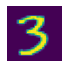

In [ ]:
show_image(three_tensors[1]);

In [ ]:
#stack sevens into rank-3 tensor
stacked_sevens = torch.stack(seven_tensors).float()/255

In [ ]:
stacked_threes = torch.stack(three_tensors).float()/255

In [ ]:
#6131 imgages of size 28x28
stacked_threes.shape

torch.Size([6131, 28, 28])

In [ ]:
#rank of tensor
len(stacked_threes.shape)

3

In [ ]:
stacked_threes.ndim

3

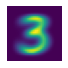

In [ ]:
mean3 = stacked_threes.mean(0)
show_image(mean3);

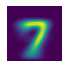

In [ ]:
mean7 = stacked_sevens.mean(0)
show_image(mean7);

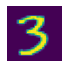

In [ ]:
a_3 = stacked_threes[1]
show_image(a_3);

In [ ]:
#L1
dist_3_abs = (a_3 -mean3).abs().mean()
#L2
dist_3_sqr = ((a_3 -mean3)**2).mean().sqrt()

dist_3_abs,dist_3_sqr

(tensor(0.1114), tensor(0.2021))

In [ ]:
#L1
dist_7_abs = (a_3 - mean7).abs().mean()
#L2
dist_7_sqr = ((a_3 - mean7)**2).mean().sqrt()

dist_7_abs,dist_7_sqr

(tensor(0.1586), tensor(0.3021))

In [ ]:
#mse penalize bigger mistakes more, and smaller mistakes less
F.l1_loss(a_3.float(),mean7), F.mse_loss(a_3,mean7).sqrt()

(tensor(0.1586), tensor(0.3021))

In [ ]:
data = [[1,2,3],[4,5,6]]
arr  = array(data)
tns  = tensor(data)

In [ ]:
#numpy
arr

array([[1, 2, 3],
       [4, 5, 6]])

In [ ]:
#pytorch
tns

tensor([[1, 2, 3],
        [4, 5, 6]])

In [ ]:
#second row
tns[1]

tensor([4, 5, 6])

In [ ]:
#second col
tns[:,1]

tensor([2, 5])

In [ ]:
tns[1,1:3]

tensor([5, 6])

In [ ]:
tns+1

tensor([[2, 3, 4],
        [5, 6, 7]])

In [ ]:
tns.type()

'torch.LongTensor'

In [ ]:
tns*1.5

tensor([[1.5000, 3.0000, 4.5000],
        [6.0000, 7.5000, 9.0000]])

In [ ]:
#create val data
valid_3_tens = torch.stack([tensor(Image.open(o)) for o in (path/'valid'/'3').ls()])
valid_3_tens = valid_3_tens.float()/255 

In [ ]:
valid_7_tens = torch.stack([tensor(Image.open(o)) for o in (path/'valid'/'7').ls()])
valid_7_tens  = valid_7_tens.float()/255 

In [ ]:
valid_3_tens.shape, valid_7_tens.shape

(torch.Size([1010, 28, 28]), torch.Size([1028, 28, 28]))

In [ ]:
def mnist_dist(a,b): return (a-b).abs().mean((-1,-2)) #calc mean for vertical and horizontal axis
mnist_dist(a_3,mean3)

tensor(0.1114)

In [ ]:
#uses broadcasting to operate on two tensors with different shape
#broadcasts the small tensor to be same shape as big tensor 
valid_3_dist = mnist_dist(valid_3_tens,mean3)
valid_3_dist, valid_3_dist.shape

(tensor([0.1484, 0.1057, 0.1446,  ..., 0.1323, 0.1217, 0.1188]),
 torch.Size([1010]))

In [ ]:
def is_3(x): return mnist_dist(x,mean3) < mnist_dist(x,mean7)

In [ ]:
is_3(a_3), is_3(a_3).float()

(tensor(True), tensor(1.))

In [ ]:
acc_3s = is_3(valid_3_tens).float().mean()
acc_7s = (1 - is_3(valid_7_tens).float()).mean()

In [ ]:
acc_3s, acc_7s,(acc_3s+acc_7s)/2

(tensor(0.9168), tensor(0.9854), tensor(0.9511))

In [ ]:
###SGD

In [ ]:
def f(x): return x**2

In [ ]:
!pip install utils

In [ ]:
def plot_function(f, tx=None, ty=None, title=None, min=-2, max=2, figsize=(6,4)):
    x = torch.linspace(min,max)
    fig,ax = plt.subplots(figsize=figsize)
    ax.plot(x,f(x));
    if tx is not None: ax.set_xlabel(tx);
    if ty is not None: ax.set_ylabel(ty);
    if title is not None: ax.set_title(title);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Not providing a value for linspace's steps is deprecated and will throw a runtime error in a future release. This warning will appear only once per process. (Triggered internally at  /pytorch/aten/src/ATen/native/RangeFactories.cpp:23.)
  


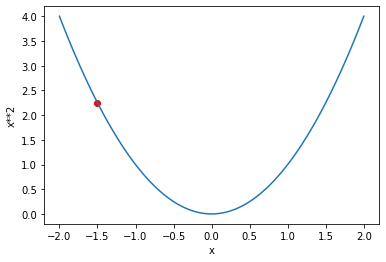

In [ ]:
plot_function(f,"x",'x**2')
plt.scatter(-1.5,f(-1.5), color='red')

In [ ]:
xt = tensor(3.).requires_grad_()

In [ ]:
yt = f(xt)
yt

tensor(9., grad_fn=<PowBackward0>)

In [ ]:
yt.backward()

In [ ]:
xt.grad

tensor(6.)

In [ ]:
xt = tensor([3.,4.,10.]).requires_grad_()
xt

tensor([ 3.,  4., 10.], requires_grad=True)

In [ ]:
def f(x):return (x**2).sum()

In [ ]:
yt=f(xt)
yt

tensor(125., grad_fn=<SumBackward0>)

In [ ]:
yt.backward()
xt.grad

tensor([ 6.,  8., 20.])

In [ ]:
time = torch.arange(0,20).float();
time

tensor([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
        14., 15., 16., 17., 18., 19.])

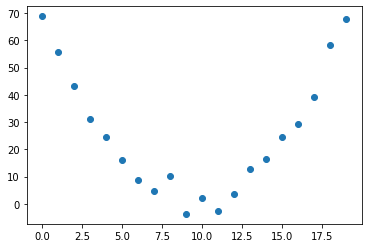

In [ ]:
speed = torch.randn(20)*3 + 0.75*(time-9.5)**2 + 1
plt.scatter(time,speed)

In [ ]:
def f(t, params):
  a,b,c = params
  return a*(t**2)+(b*t)+c

In [ ]:
def mse(preds, targets): return ((preds-targets)**2).mean()

In [ ]:
#Step 1: init params
params = torch.randn(3).requires_grad_()

In [ ]:
#Step 2: calc preds
preds = f(time, params)

In [ ]:
def show_preds(preds, ax=None):
  if ax is None: ax = plt.subplots()[1]
  ax.scatter(time, speed)
  ax.scatter(time, to_np(preds), color='red')
  ax.set_ylim(-300,100)

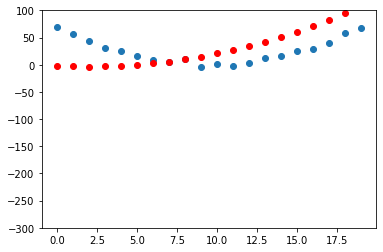

In [ ]:
show_preds(preds)

In [ ]:
#step 3: calc loss
loss = mse(preds, speed)
loss

tensor(1263.4061, grad_fn=<MeanBackward0>)

In [ ]:
#step 4: calc grads
loss.backward()
params.grad

tensor([7944.2095,  482.9414,   10.3659])

In [ ]:
params.grad*1e-5

tensor([0.0794, 0.0048, 0.0001])

In [ ]:
params

tensor([ 0.3896, -1.6668, -1.5765], requires_grad=True)

In [ ]:
#step 5: step weights
lr = 1e-5
params.data -= lr*params.grad.data
params.grad = None

<h1>
  Backward prop:
</h1>
<p>
  loss.backward() --> loss = mse(preds, speed) --> preds = f(time, params) -> params.requires_grads_()
</p>

In [ ]:
preds = f(time, params)
mse(preds, speed)

tensor(808.9086, grad_fn=<MeanBackward0>)

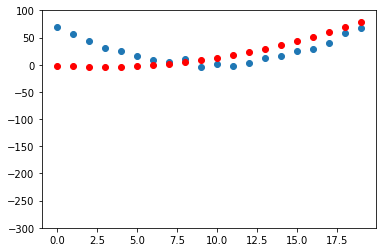

In [ ]:
show_preds(preds)

In [ ]:
def apply_step(params, prn=True):
  preds = f(time, params)
  loss  = mse(preds, speed)
  loss.backward()
  params.data -= lr * params.grad.data
  params.grad  = None
  if prn: print(loss.item())
  return preds

In [ ]:
for i in range(10):
  apply_step(params)

808.9085693359375
722.89306640625
706.6055908203125
703.5128173828125
702.9168090820312
702.7933959960938
702.75927734375
702.7421264648438
702.7281494140625
702.7149047851562


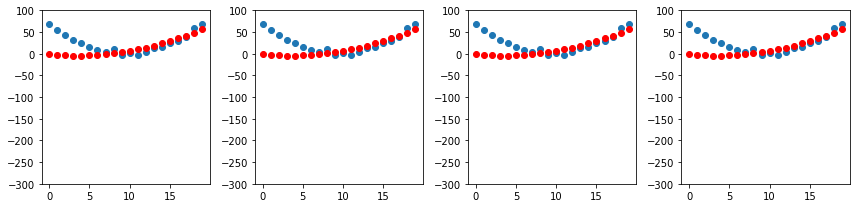

In [ ]:
_, axs = plt.subplots(1,4,figsize=(12,3))
for ax in axs: show_preds(apply_step(params, False), ax)
plt.tight_layout()

The MNIST loss function

In [ ]:
#concat imgs to a rank-2 tensor
train_x = torch.cat([stacked_threes, stacked_sevens]).view(-1,28*28)

In [ ]:
train_y = tensor([1]*len(threes) + [0]*len(sevens)).unsqueeze(1)

In [ ]:
#12396 rows, 784 (28*28) features
train_x.shape, train_y.shape

(torch.Size([12396, 784]), torch.Size([12396, 1]))

In [ ]:
dset = list(zip(train_x,train_y))
x,y  = dset[0]
x.shape,y

(torch.Size([784]), tensor([1]))

In [ ]:
dset

[(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000

In [ ]:
valid_x = torch.cat([valid_3_tens, valid_7_tens]).view(-1, 28*28)
valid_y = tensor([1]*len(valid_3_tens) + [0]*len(valid_7_tens)).unsqueeze(1)
valid_dset = list(zip(valid_x,valid_y))

In [ ]:
valid_dset

[(tensor([0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000

In [ ]:
def init_params(size, std=1.0):
  return (torch.randn(size)*std).requires_grad_()
weights = init_params((28*28,1))
bias = init_params(1)

In [ ]:
weights.shape

torch.Size([784, 1])

In [ ]:
bias

tensor([-0.8293], requires_grad=True)

In [ ]:
#pred for first img:
(train_x[0]*weights.T).sum()+bias

tensor([7.7582], grad_fn=<AddBackward0>)

In [ ]:
def linear1(xb): return xb@weights + bias

In [ ]:
preds = linear1(train_x)
preds

tensor([[ 7.7582e+00],
        [ 5.9808e+00],
        [-4.3274e+00],
        ...,
        [-7.8220e+00],
        [-2.4472e-03],
        [ 8.0087e+00]], grad_fn=<AddBackward0>)

In [ ]:
corrects = (preds>0.0).float() == train_y

In [ ]:
corrects

tensor([[ True],
        [ True],
        [False],
        ...,
        [ True],
        [ True],
        [False]])

In [ ]:
corrects.float().mean().item()

0.4553888440132141

In [ ]:
#change weight 0
weights[0] *= 1.0001

In [ ]:
preds = linear1(train_x)
((preds>0).float() == train_y).float().mean().item()

0.4553888440132141

In [ ]:
def mnist_loss(predictions, targets):
  '''Returns mean distance from correct label'''
  return torch.where(targets==1, 1-predictions, predictions).mean()

In [ ]:
trgts = tensor([1,0,1])
prds  = tensor([0.9,0.4,0.2])
torch.where(trgts==1, 1-prds, prds)

tensor([0.1000, 0.4000, 0.8000])

In [ ]:
mnist_loss(prds, trgts)

tensor(0.4333)

In [ ]:
#lossfn. assumes preds is either 1 or 0, need to squash:
def sigmoid(x): return 1/(1+torch.exp(-x))

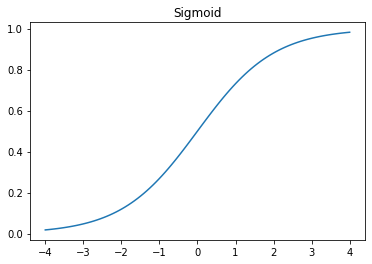

In [ ]:
plot_function(torch.sigmoid, title="Sigmoid", min=-4,max=4)

In [ ]:
def mnist_loss(preds, targets):
  preds = preds.sigmoid()
  return torch.where(targets==1,1-preds,preds).mean()

In [ ]:
#Loss is for automated learning, metric is for humans. 
#Care more about metrics than loss when evaluating model.

In [ ]:
#Mini batches:
#Too many: slow processing and overloaded GPU
#Too few: doesn't learn anything usefull 

In [ ]:
coll = range(15)
#randomly shuffles data -> better generalization
dl = DataLoader(coll, batch_size=5, shuffle=True)
list(dl)

[tensor([ 6, 11,  2,  8,  7]),
 tensor([ 3,  0, 13, 14, 12]),
 tensor([ 4,  1,  5, 10,  9])]

In [ ]:
ds = L(enumerate(string.ascii_lowercase))
ds

(#26) [(0, 'a'),(1, 'b'),(2, 'c'),(3, 'd'),(4, 'e'),(5, 'f'),(6, 'g'),(7, 'h'),(8, 'i'),(9, 'j')...]

In [ ]:
dl = DataLoader(ds, batch_size=6, shuffle=True)
list(dl)

[(tensor([ 2, 11,  1, 19, 16, 23]), ('c', 'l', 'b', 't', 'q', 'x')),
 (tensor([ 0,  4, 10,  8, 24, 12]), ('a', 'e', 'k', 'i', 'y', 'm')),
 (tensor([ 7,  9, 15, 14, 22, 21]), ('h', 'j', 'p', 'o', 'w', 'v')),
 (tensor([ 6, 20, 17, 25, 18, 13]), ('g', 'u', 'r', 'z', 's', 'n')),
 (tensor([5, 3]), ('f', 'd'))]

In [ ]:
#Showing the gradient descent process
#for x,y in dl:
#  pred = model(x)
#  loss = loss_func(pred, y)
#  loss.backward()
#  parameters -= parameters.grad * lr

In [ ]:
weights = init_params((28*28,1))
bias    = init_params(1)

In [ ]:
dl = DataLoader(dset, batch_size=256)
xb, yb = first(dl)
xb.shape, yb.shape #<- first batch

(torch.Size([256, 784]), torch.Size([256, 1]))

In [ ]:
valid_dl = DataLoader(valid_dset, batch_size=256)

In [ ]:
batch = train_x[:4]
batch.shape

torch.Size([4, 784])

In [ ]:
preds = linear1(batch)
preds

tensor([[10.4602],
        [ 4.1694],
        [ 3.4970],
        [ 6.3785]], grad_fn=<AddBackward0>)

In [ ]:
loss = mnist_loss(preds, train_y[:4])
loss

tensor(0.0116, grad_fn=<MeanBackward0>)

In [ ]:
loss.backward()
weights.grad.shape,weights.grad.mean(),bias.grad

(torch.Size([784, 1]), tensor(-0.0016), tensor([-0.0113]))

In [ ]:
def calc_grad(xb, yb, model):
  preds = model(xb)
  loss = mnist_loss(preds, yb)
  loss.backward()

In [ ]:
calc_grad(batch, train_y[:4], linear1)
weights.grad.mean(), bias.grad

(tensor(-0.0033), tensor([-0.0226]))

In [ ]:
#ending with _ indicates in-place operations
weights.grad.zero_()
bias.grad.zero_()

tensor([0.])

In [ ]:
def train_epoch(model, lr, params):
  for xb, yb in dl:
    calc_grad(xb, yb, model)
    for p in params:
      p.data -= p.grad*lr
      p.grad.zero_()

In [ ]:
def batch_accuracy(xb, yb):
  preds = xb.sigmoid()
  correct = (preds > 0.5) == yb
  return correct.float().mean()

In [ ]:
def validate_epoch(model):
  accs = [batch_accuracy(model(xb), yb) for xb,yb in valid_dl]
  return round(torch.stack(accs).mean().item(), 4)

In [ ]:
validate_epoch(linear1)

0.4717

In [ ]:
lr = 1
params = weights, bias
train_epoch(linear1, lr, params)
validate_epoch(linear1)

0.6139

In [ ]:
for i in range(20):
  train_epoch(linear1, lr, params)
  print(validate_epoch(linear1),end=" ")

0.7969 0.914 0.9419 0.9531 0.9589 0.9619 0.9628 0.9628 0.9648 0.9653 0.9648 0.9643 0.9648 0.9653 0.9662 0.9667 0.9672 0.9672 0.9677 0.9677 

In [ ]:
##Creating an optimizer


In [ ]:
linear_model = nn.Linear(28*28, 1)
w,b = linear_model.parameters()
w.shape, b.shape

(torch.Size([1, 784]), torch.Size([1]))

In [ ]:
class BasicOptim:
  def __init__(self, params, lr):
    self.params = list(params)
    self.lr = lr

  def step(self, *args, **kwargs):
    for p in self.params:
      p.data -= p.grad.data * self.lr

  def zero_grad(self, *args, **kwargs):
    for p in self.params:
      p.grad = None

opt = BasicOptim(linear_model.parameters(), lr)

In [ ]:
def train_epoch(model):
  for xb,yb in dl:
    calc_grad(xb, yb, model)
    opt.step()
    opt.zero_grad()

##Old train_epoch:
#def train_epoch(model, lr, params):
#  for xb, yb in dl:
#    calc_grad(xb, yb, model)
#    for p in params:
#      p.data -= p.grad*lr
#      p.grad.zero_()

In [ ]:
validate_epoch(linear_model)

0.2624

In [ ]:
def train_model(model, epochs):
  for i in range(epochs):
    train_epoch(model)
    print(f'Epoch {i+1} | Accuracy: {validate_epoch(model)}')

In [ ]:
train_model(linear_model, 20)

Epoch 1 | Accuracy: 0.4932
Epoch 2 | Accuracy: 0.8252
Epoch 3 | Accuracy: 0.8384
Epoch 4 | Accuracy: 0.9131
Epoch 5 | Accuracy: 0.9331
Epoch 6 | Accuracy: 0.9477
Epoch 7 | Accuracy: 0.955
Epoch 8 | Accuracy: 0.9624
Epoch 9 | Accuracy: 0.9658
Epoch 10 | Accuracy: 0.9672
Epoch 11 | Accuracy: 0.9697
Epoch 12 | Accuracy: 0.9721
Epoch 13 | Accuracy: 0.9736
Epoch 14 | Accuracy: 0.9751
Epoch 15 | Accuracy: 0.9755
Epoch 16 | Accuracy: 0.9765
Epoch 17 | Accuracy: 0.9775
Epoch 18 | Accuracy: 0.978
Epoch 19 | Accuracy: 0.9785
Epoch 20 | Accuracy: 0.9785


In [ ]:
linear_model = nn.Linear(28*28,1)
opt = SGD(linear_model.parameters(), lr)
train_model(linear_model, 20)

Epoch 1 | Accuracy: 0.4932
Epoch 2 | Accuracy: 0.6973
Epoch 3 | Accuracy: 0.8574
Epoch 4 | Accuracy: 0.917
Epoch 5 | Accuracy: 0.935
Epoch 6 | Accuracy: 0.9507
Epoch 7 | Accuracy: 0.956
Epoch 8 | Accuracy: 0.9629
Epoch 9 | Accuracy: 0.9653
Epoch 10 | Accuracy: 0.9677
Epoch 11 | Accuracy: 0.9707
Epoch 12 | Accuracy: 0.9726
Epoch 13 | Accuracy: 0.9746
Epoch 14 | Accuracy: 0.9746
Epoch 15 | Accuracy: 0.976
Epoch 16 | Accuracy: 0.9765
Epoch 17 | Accuracy: 0.9775
Epoch 18 | Accuracy: 0.978
Epoch 19 | Accuracy: 0.9785
Epoch 20 | Accuracy: 0.979


In [ ]:
dls = DataLoaders(dl, valid_dl)

In [ ]:
learn = Learner(dls, nn.Linear(28*28,1), opt_func=SGD,
                loss_func=mnist_loss, metrics=batch_accuracy)
learn.fit(10, lr=lr)

epoch,train_loss,valid_loss,batch_accuracy,time
0,0.636245,0.503250,0.495584,00:00
1,0.445768,0.253137,0.772816,00:00
2,0.167108,0.158966,0.857704,00:00
3,0.074916,0.098692,0.918057,00:00
4,0.040813,0.073680,0.935721,00:00
5,0.027419,0.059768,0.949460,00:00
6,0.021869,0.050988,0.956330,00:00
7,0.019365,0.045087,0.963690,00:00
8,0.018070,0.040907,0.966143,00:00
9,0.017278,0.037805,0.968597,00:00


In [ ]:
##ADDING NONLINEARITY

In [ ]:
def simple_net(xb):
  res = xb@w1 + b1
  #ReLU
  res = res.max(tensor(0.0))
  res = res@w2 + b2
  return res

In [ ]:
w1 = init_params((28*28,30))
b1 = init_params(30)
w2 = init_params((28*28,30))
b2 = init_params(1)

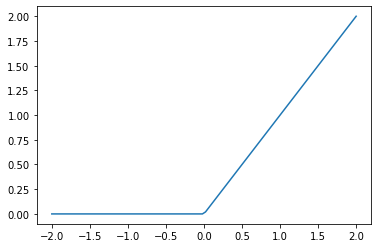

In [ ]:
plot_function(F.relu)

In [ ]:
simple_net = nn.Sequential(
    nn.Linear(28*28, 30),
    nn.ReLU(),
    nn.Linear(30,1)
)

In [ ]:
learn = Learner(dls, simple_net, opt_func=SGD,
                loss_func=mnist_loss, metrics=batch_accuracy)
learn.fit(40, 0.1)

epoch,train_loss,valid_loss,batch_accuracy,time
0,0.318149,0.415192,0.504416,00:00
1,0.149424,0.228526,0.806673,00:00
2,0.082220,0.114826,0.916094,00:00
3,0.053736,0.077615,0.940137,00:00
4,0.040586,0.060779,0.957311,00:00
5,0.033900,0.051300,0.963690,00:00
6,0.030070,0.045313,0.966143,00:00
7,0.027587,0.041200,0.966634,00:00
8,0.025804,0.038192,0.969578,00:00
9,0.024426,0.035886,0.969578,00:00


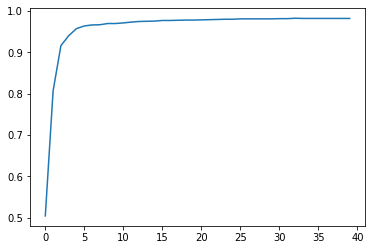

In [ ]:
plt.plot(L(learn.recorder.values).itemgot(2));

In [ ]:
learn.recorder.values[-1][2]

0.981844961643219

In [ ]:
dls = ImageDataLoaders.from_folder(path)
learn = cnn_learner(dls, resnet18, pretrained=False,
                    loss_func=F.cross_entropy, metrics=accuracy)

In [ ]:
learn.fit_one_cycle(1, 0.1)

epoch,train_loss,valid_loss,accuracy,time
0,0.082598,0.015039,0.996075,00:23
